# Crop Field Siamese with Triplet Loss with Classification

This notebook is part of the field boundary detection project. The goal is to evaluate the algorithm using 2D time series of the same h3 hex AND semi-supervised contrastive learning with Graph-based segmentation.

## Summary
[1. Data Processing](#data_processing)

[2. Model Training](#model_training)

[3. Segmentation](#segmentation)

## Load required libraries

In [1]:
import sys

# Install packages required only once
install_packages = False

if install_packages:
    !{sys.executable} -m pip install sklearn
    !{sys.executable} -m pip install seaborn
    !{sys.executable} -m pip install utm
    !{sys.executable} -m pip install selenium

In [2]:
import math
import matplotlib.pyplot as plt
from matplotlib import pyplot

import tensorflow as tf
import tensorflow_datasets as tfds
from tensorflow import keras
from tensorflow.keras import layers

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

import seaborn.objects as so
import seaborn as sns

import pandas as pd
import numpy as np

import folium
import h3
import uuid

In [3]:
tid = str(uuid.uuid4()).split('-')[0]

## Hyper-parameters and other constants

In [4]:
temporal_samples = 15
band_features = ['B01', 'B02', 'B03', 'B04', 'B05', 'B06', 'B07', 'B08', 'B8A', 'B09', 'B11', 'B12']
#band_features = ['B02', 'B03', 'B04'] # only RGB spectral
number_of_bands = len(band_features)
description = 'Bringing all sentinel-2 bands back'

# output vector size
width = 10

AUTOTUNE = tf.data.AUTOTUNE
shuffle_buffer = 50
num_epochs = 200

train_only_on_accurate_samples = True
siamese_margin = 50

loss_function_distance = 'cosine' # 'cosine' or 'euclidean'

# Sample creation parameters
sampling_method = 'season' # 'shuffle', 'season' 
fills_sample_whentimeseries_navailable = False

visualization_level = 3
# vl = 0 : No visuals at all
# vl = 1 : Just visuals that are proportional to results
# vl = 2 : Visuals that show results and maps
# vl = 3 : All visuals

generate_paper_info = False

In [5]:
field_index = 11

<a id='data_processing'></a>

# 1. Data Processing

<div>
<img border="5px" src="../res/dataprocessing.png" width="1000"/>
</div>

## Configure the train and test datasets

In [6]:
from pathlib import Path

positive_samples_folder = Path('D:\\173_seeding_harvest_joined_USCA_mini.parquet\\positive_samples\\hex_index_L3=8348b3fffffffff')
negative_samples_folder = Path('D:\\173_seeding_harvest_joined_USCA_mini.parquet\\negative_samples\\hex_index_L3=8348b3fffffffff')

## Load all parquet files from the configured folder

In [7]:
# load positive hexes
df_positive = pd.concat(
            pd.read_parquet(parquet_file)
            for parquet_file in positive_samples_folder.rglob('*.parquet')
         )

# load negative hexes
df_negative = pd.concat(
            pd.read_parquet(parquet_file)
            for parquet_file in negative_samples_folder.rglob('*.parquet'))

print('The shape of loaded positive dataframe before dropping duplicates is:', df_positive.shape)
print('The shape of loaded negative dataframe before dropping duplicates is:', df_negative.shape)

df_positive = df_positive.drop_duplicates()
df_negative = df_negative.drop_duplicates()

# create timestamp columns based on scene_id
df_positive['timestamp'] = df_positive.scene_id.str[11:26]
df_negative['timestamp'] = df_negative.scene_id.str[11:26]

print('The shape of loaded positive dataframe before dropping duplicates is:', df_positive.shape)
print('The shape of loaded negative dataframe before dropping duplicates is:', df_negative.shape)

display(df_positive.head(5))
display(df_negative.head(5))


The shape of loaded positive dataframe before dropping duplicates is: (98148, 19)
The shape of loaded negative dataframe before dropping duplicates is: (74163, 19)
The shape of loaded positive dataframe before dropping duplicates is: (98148, 20)
The shape of loaded negative dataframe before dropping duplicates is: (74163, 20)


,start_date,end_date,FIELD_OPERATION_GUID,scene_id,hex,SCL_val,s2_tile,B01,B02,B03,B04,B05,B06,B07,B08,B8A,B09,B11,B12,timestamp
0,2018-10-27T00:00:00+00:00,2019-08-13T00:00:00+00:00,1107dbf9-a4d7-40cc-8899-27461e584ce2 2019-02-24,S2A_MSIL2A_20181029T170421_N0001_R069_T14RPQ_2...,8c48b3c444c13ff,4,14RPQ,521.0,536.0,1036.0,634.0,1486.0,3316.0,3837.0,3984.0,4040.0,3963.0,2649.0,1518.0,20181029T170421
1,2018-10-27T00:00:00+00:00,2019-08-13T00:00:00+00:00,1107dbf9-a4d7-40cc-8899-27461e584ce2 2019-02-24,S2A_MSIL2A_20181029T170421_N0001_R069_T14RPQ_2...,8c48b3c444c17ff,4,14RPQ,521.0,537.0,1036.0,638.0,1504.0,3390.0,3843.0,3842.0,4074.0,3963.0,2607.0,1495.0,20181029T170421
2,2018-10-27T00:00:00+00:00,2019-08-13T00:00:00+00:00,1107dbf9-a4d7-40cc-8899-27461e584ce2 2019-02-24,S2A_MSIL2A_20181029T170421_N0001_R069_T14RPQ_2...,8c48b3c444c23ff,4,14RPQ,527.0,565.0,849.0,753.0,1390.0,2555.0,2796.0,2536.0,3128.0,3746.0,2583.0,1605.0,20181029T170421
3,2018-10-27T00:00:00+00:00,2019-08-13T00:00:00+00:00,1107dbf9-a4d7-40cc-8899-27461e584ce2 2019-02-24,S2A_MSIL2A_20181029T170421_N0001_R069_T14RPQ_2...,8c48b3c444c27ff,4,14RPQ,556.0,509.0,979.0,736.0,1462.0,2922.0,3187.0,3292.0,3500.0,3856.0,2598.0,1540.0,20181029T170421
4,2018-10-27T00:00:00+00:00,2019-08-13T00:00:00+00:00,1107dbf9-a4d7-40cc-8899-27461e584ce2 2019-02-24,S2A_MSIL2A_20181029T170421_N0001_R069_T14RPQ_2...,8c48b3c444c31ff,4,14RPQ,527.0,536.0,1011.0,660.0,1512.0,3284.0,3733.0,3654.0,3985.0,3746.0,2603.0,1538.0,20181029T170421


,start_date,end_date,FIELD_OPERATION_GUID,scene_id,hex,SCL_val,s2_tile,B01,B02,B03,B04,B05,B06,B07,B08,B8A,B09,B11,B12,timestamp
0,2018-10-27T00:00:00+00:00,2019-08-13T00:00:00+00:00,1107dbf9-a4d7-40cc-8899-27461e584ce2 2019-02-24,S2A_MSIL2A_20181029T170421_N0001_R069_T14RPQ_2...,8c48b3c444c01ff,5,14RPQ,888.0,1034.0,1458.0,1546.0,1956.0,3277.0,3696.0,4004.0,3844.0,3662.0,3317.0,2241.0,20181029T170421
1,2018-10-27T00:00:00+00:00,2019-08-13T00:00:00+00:00,1107dbf9-a4d7-40cc-8899-27461e584ce2 2019-02-24,S2A_MSIL2A_20181029T170421_N0001_R069_T14RPQ_2...,8c48b3c444c03ff,4,14RPQ,888.0,934.0,1272.0,1340.0,1669.0,2765.0,3081.0,2800.0,3364.0,3662.0,2883.0,1914.0,20181029T170421
2,2018-10-27T00:00:00+00:00,2019-08-13T00:00:00+00:00,1107dbf9-a4d7-40cc-8899-27461e584ce2 2019-02-24,S2A_MSIL2A_20181029T170421_N0001_R069_T14RPQ_2...,8c48b3c444c05ff,4,14RPQ,888.0,1042.0,1458.0,1552.0,1903.0,3050.0,3344.0,3124.0,3636.0,3662.0,3379.0,2425.0,20181029T170421
3,2018-10-27T00:00:00+00:00,2019-08-13T00:00:00+00:00,1107dbf9-a4d7-40cc-8899-27461e584ce2 2019-02-24,S2A_MSIL2A_20181029T170421_N0001_R069_T14RPQ_2...,8c48b3c444c07ff,4,14RPQ,888.0,956.0,1256.0,1370.0,1643.0,2492.0,2738.0,2832.0,3076.0,3662.0,2916.0,2007.0,20181029T170421
4,2018-10-27T00:00:00+00:00,2019-08-13T00:00:00+00:00,1107dbf9-a4d7-40cc-8899-27461e584ce2 2019-02-24,S2A_MSIL2A_20181029T170421_N0001_R069_T14RPQ_2...,8c48b3c444c0bff,4,14RPQ,760.0,916.0,1368.0,1090.0,1844.0,3406.0,3768.0,4232.0,4069.0,3958.0,3155.0,1978.0,20181029T170421


## Unique fields in the dataset

In [8]:
test_field = df_positive.FIELD_OPERATION_GUID.unique()[field_index]
val_field = df_positive.FIELD_OPERATION_GUID.unique()[field_index+1]
print('Test Field = ', test_field)
print('Validation Field = ', val_field)

Test Field =  f8eac6b5-f0e8-4830-aefd-fef10b4cf21e 2019-02-16
Validation Field =  2250d517-71d5-429c-a74c-99993af1aad0 2019-02-24


In [9]:
print(df_positive.FIELD_OPERATION_GUID.unique())

<StringArray>
['1107dbf9-a4d7-40cc-8899-27461e584ce2 2019-02-24',
 '19fae4c4-2836-4a04-8545-bc0675b81718 2019-02-17',
 '48a7e321-1c27-41ed-8b23-0342c2568584 2019-02-16',
 '492c2e8e-297d-48f9-9b7d-38ea5c183bab 2019-02-14',
 '8300721c-a085-4fc0-8520-763f1db45406 2019-02-23',
 '92de1446-f94f-4d5f-bcb3-fb685cb391a1 2019-02-16',
 'ba5ae73a-9050-48e4-a999-c0f650c5ff4c 2019-02-16',
 'c641db68-9a04-4e19-b44a-8bc164a1eb48 2019-02-25',
 'c94a78ec-8c40-4142-bb90-dea4abf249d9 2019-02-25',
 'c9ff1785-e460-4fce-b5f1-7f7d4600ab9f 2019-02-17',
 'ece0e5aa-a035-4542-bfc0-838089538658 2019-02-24',
 'f8eac6b5-f0e8-4830-aefd-fef10b4cf21e 2019-02-16',
 '2250d517-71d5-429c-a74c-99993af1aad0 2019-02-24',
 '76d2659a-e3e0-47e5-a2f5-2c2d6c583b6a 2019-02-24',
 'a13ec21c-6300-40c3-9c5f-cfe52c962619 2019-03-02',
 '06ec31a9-d0f7-4e5d-a751-b25d2cd9b656 2019-03-02',
 'a3c1aa07-0cd1-423d-b7af-9d1ad8b7ddd6 2019-03-02']
Length: 17, dtype: string


## Remove hexes that are represented in both positive and negative datasets

In [10]:
# I could also just set it to "field" samples, since we know machine was in the 
# position but let's remove for the sake of class balacing

print('In this dataset there are ', df_positive.hex.unique().size, ' different positive hexes')
print('In this dataset there are ', df_negative.hex.unique().size, ' different negative hexes')

positive_l12_hexes = df_positive.hex.unique()
negative_l12_hexes = df_negative.hex.unique()

ambiguous_l12_hexes = set(positive_l12_hexes).intersection(negative_l12_hexes)
print('There are ', len(ambiguous_l12_hexes), ' hexes labeled both as positive and negative')

df_positive = df_positive[~df_positive['hex'].isin(ambiguous_l12_hexes)]
df_negative = df_negative[~df_negative['hex'].isin(ambiguous_l12_hexes)]

print('In this dataset there are ', df_positive.hex.unique().size, ' different positive hexes')
print('In this dataset there are ', df_negative.hex.unique().size, ' different negative hexes')

In this dataset there are  4939  different positive hexes
In this dataset there are  3772  different negative hexes
There are  184  hexes labeled both as positive and negative
In this dataset there are  4755  different positive hexes
In this dataset there are  3588  different negative hexes


There are hexes with temporal samples from 16 to 37


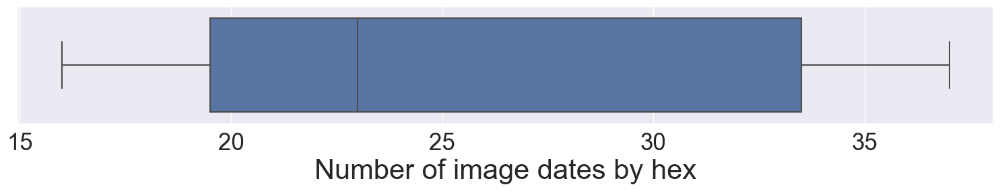

In [11]:
if visualization_level > 2:
    sns.set(rc={'figure.figsize':(18.7,2.27)})

    temporal_samples_count = df_positive.groupby(['hex'])['hex'].count()

    print('There are hexes with temporal samples from', temporal_samples_count.min(), 'to', temporal_samples_count.max())

    hist = pd.DataFrame(temporal_samples_count) \
            .rename(columns={'hex': 'count'}) \
            .reset_index(level=0) \
            .groupby(['count'])['count'].count()

    hist_df = pd.DataFrame(hist) \
              .rename(columns={'count': 'frequency'}) \
              .reset_index(level=0)

    #so.Plot(hist_df["count"], hist_df["frequency"]) \
    #    .add(so.Bar()) \
    #    .scale(x=so.Continuous().tick(every=2)) \
    #    .layout(size=(10, 4))

    ax = sns.boxplot(x=hist_df["count"])

    ax.set_xlabel("Number of image dates by hex",fontsize=30)
    ax.tick_params(labelsize=25)

## Sentinel 2 bands
These are the 12 bands contained in the parque files and their respective meanings

<div>
<img src="../res/sentinel2-bands.png" width="500"/>
</div>

## Show some of the L12 hexes loaded in the folium map

In [12]:
if train_only_on_accurate_samples:
    # Drop hexes from non-conclusive areas
    drop_list = np.loadtxt('drop_list.csv', delimiter=',', dtype='str')

    df_negative = df_negative[~df_negative['hex'].isin(drop_list)]
    df_positive = df_positive[~df_positive['hex'].isin(drop_list)]
    
    # Treat false negatives
    false_negatives = np.loadtxt('false_negatives.csv', delimiter=',', dtype='str')

    df_negative = df_negative.assign(label=0)
    df_positive = df_positive.assign(label=1)
    
    df_negative = df_negative.reset_index()
    df_positive = df_positive.reset_index()
    
    # Assign to negatives recognized as false the label 1
    df_negative.loc[df_negative['hex'].isin(false_negatives), 'label'] = 1

    df_positive = pd.concat([df_positive, df_negative[df_negative.label==1]])
    
    df_negative = df_negative.drop(df_negative[df_negative.label == 1].index)
    print('Trained on manually curated samples.')

Trained on manually curated samples.


In [13]:
if generate_paper_info:
    for index, f in enumerate(df_positive.FIELD_OPERATION_GUID.unique()):
        print('F{:02d}'.format(index+1) +
              '&'+
              f'{df_positive[df_positive.FIELD_OPERATION_GUID == f].hex.nunique():,}' +
              '&'+
              f'{df_negative[df_negative.FIELD_OPERATION_GUID == f].hex.nunique()}' +
              '&'+
              f'{df_positive[df_positive.FIELD_OPERATION_GUID == f].hex.count():,}' +
              '&'+
              f'{df_negative[df_negative.FIELD_OPERATION_GUID == f].hex.count():,}' +
              '&'+
              '{:.2f}'.format(df_positive[df_positive.FIELD_OPERATION_GUID == f].groupby("hex").hex.count().mean()) +
              '&'+
              '{:.2f}'.format(df_positive[df_positive.FIELD_OPERATION_GUID == f].groupby("hex").hex.count().std()) +
              '\\\\'
             )


## Display hexes in the map

In [14]:
import io
from PIL import Image

def display_hexes_map(dfp, dfn, hexes_to_print, filename=None):

    h3_hex = h3.h3_to_parent(dfp.iloc[0]['hex'], 3)

 
    dfp = dfp.drop_duplicates(subset='hex', keep="first").head(hexes_to_print)
    dfn = dfn.drop_duplicates(subset='hex', keep="first").head(hexes_to_print)
    
    min_lat, min_long = 9999999,9999999
    max_lat, max_long = -9999999,-9999999
    
    
    for h in dfn.hex:
        p = h3.h3_to_geo(h)
        
        if p[0] < min_lat:
            min_lat = p[0]
            
        if p[0] > max_lat:
            max_lat = p[0]
            
        if p[1] < min_long:
            min_long = p[1]
            
        if p[1] > max_long:
            max_long = p[1]
            
    bounds = [[min_lat, min_long], [max_lat, max_long]]
    print(bounds)

    m = folium.Map(
                    tiles = 'https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}',
                    attr = 'Esri',
                    name = 'Esri Satellite',
                    zoom_start=11,
                    fit_bounds=[[-97.7198928194847,26.236073089251086],[-97.66473848550342,26.243580591892144]],
                    overlay = False,
                    control = True)

    # Print h3 hex
    geometry = { "type" : "Polygon", "coordinates": [h3.h3_to_geo_boundary(h=h3_hex,geo_json=True)]}
    geo_j = folium.GeoJson(data=geometry, style_function=lambda x: {'fillColor': 'white', 'color': 'white', 'weight': 0.5})
    geo_j.add_to(m)

    # Print positive samples
    for index, row in dfp.iterrows():
        geometry = { "type" : "Polygon", "coordinates": [h3.h3_to_geo_boundary(h=row['hex'],geo_json=True)]}
        geo_j = folium.GeoJson(data=geometry, style_function=lambda x: {'fillColor': 'yellow', 'color': 'green', 'weight': 0.5})
        folium.Popup(str(row['FIELD_OPERATION_GUID']) + ' ' + str(row['hex'])).add_to(geo_j)
        geo_j.add_to(m)

    # Print negative samples
    for index, row in dfn.iterrows():
        geometry = { "type" : "Polygon", "coordinates": [h3.h3_to_geo_boundary(h=row['hex'],geo_json=True)]}
        geo_j = folium.GeoJson(data=geometry, style_function=lambda x: {'fillColor': 'red', 'color': 'black', 'weight': 0.5})
        folium.Popup(str(row['FIELD_OPERATION_GUID']) + ' ' + str(row['hex'])).add_to(geo_j)
        geo_j.add_to(m)

    m.fit_bounds(bounds)
    
    display(m)
    
    if filename is not None:
        img_data = m._to_png(5)
        img = Image.open(io.BytesIO(img_data))
        img.save(filename)


if visualization_level > 0:
    display_hexes_map(df_positive, df_negative, 5000)

[[26.22194024859925, -97.8255576124415], [26.264045207530053, -97.64784801697773]]


# Visualize the samples in the space reduced to 2 dimensions

In [15]:
def generate_samples(dfp, dfn, sampling_method = 'shuffle', fills_sample_whentimeseries_navailable = False):

    # Keep only [temporal samples] samples 
    dfp = dfp.sort_values(by=['hex','timestamp','B12'])
    dfp = dfp.groupby('hex').head(temporal_samples)

    dfn = dfn.sort_values(by=['hex','timestamp','B12'])
    dfn = dfn.groupby('hex').head(temporal_samples)
    
    #display(dfn.head(temporal_samples))

    # Associate labels picked manually
    dfn = dfn.assign(label=0)
    dfp = dfp.assign(label=1)
    df = pd.concat([dfp, dfn], axis=0)

    df = df.reset_index()

    df['timestamp'] = pd.to_datetime(df['timestamp'], format="%Y%m%dT%H%M%S")

    print('Number of total rows:' +  str(len(df.index)))
    print('Number of rows in positive dataset:' +  str(len(dfp.index)))
    print('Number of rows in negative dataset:' +  str(len(dfp.index)))
    print('Number of unique positive hexes:' +  str(dfp.hex.nunique()))
    print('Number of unique negative hexes:' +  str(dfp.hex.nunique()))


    if fills_sample_whentimeseries_navailable:
        grouped_df = df.groupby(['hex'])

        new_df = pd.DataFrame(columns=df.columns)

        # Loop through each group in the grouped DataFrame
        count = 0;
        hexes_count = df['hex'].nunique()
        for group_name, group_data in grouped_df:
            count = count + 1
            pct_complete = count/hexes_count * 100
            print('Packing {0:.2f}'.format(pct_complete) + '% (' + str(count) + '/' + str(hexes_count) + ')', end='\r')

            # Check if the group has more than 5 rows
            if len(group_data) > temporal_samples:
                # If yes, randomly sample 5 rows and add them to the new DataFrame
                new_rows = group_data.sample(n=temporal_samples, replace=False)
                new_df = pd.concat([new_df, new_rows])
            else:
                # If no, repeat the existing rows until there are 5 rows and add them to the new DataFrame
                num_repeats = temporal_samples // len(group_data) + 1
                repeated_rows = pd.concat([group_data] * num_repeats, ignore_index=True)
                new_rows = repeated_rows.iloc[:temporal_samples]
                new_df = pd.concat([new_df, new_rows])

        # View the new DataFrame
        display(new_df)

        df = new_df.copy()


    df[band_features] = StandardScaler().fit_transform(df[band_features])

    # Organize the 2D samples in numpy arrays
    sample = np.zeros((temporal_samples, number_of_bands), dtype=np.float64)
    X_array = np.empty((0, temporal_samples, number_of_bands),  dtype=np.float64)

    labels = []
    hexes = []
    fop = []
    timestamp_tracking = []
    timestamp_sample = []

    sub_index = 0
    count = 0;
    for index, row in df.iterrows():
        pct_complete = count/df.shape[0] * 100
        print('Sampling {0:.2f}'.format(pct_complete) + '%', end='\r')
        count = count + 1

        # fill the band values in a temporal row
        for idx,b in enumerate(band_features):
            sample[sub_index][idx] = row[b]


        timestamp_sample.append(row.timestamp)

        # increment row number 
        sub_index = sub_index + 1

        # if reached last row of temporal samples, increment to next sample
        if sub_index == temporal_samples:

            if sampling_method == 'shuffle':
                shuffler = np.random.permutation(sample.shape[0])
                sample = sample[shuffler]
                timestamp_sample = list(np.array(timestamp_sample)[shuffler])

            elif sampling_method == 'season':
                try:
                    timestamp_sample_aux = []

                    winter_samples = [i for i, s in enumerate(timestamp_sample) if int(s[4:6]) >= 1 and int(s[4:6]) <= 3]
                    winter_samples = np.random.choice(winter_samples, size=temporal_samples/4)
                    winter_array = np.array(sample)[winter_samples]
                    timestamp_sample_aux.extend([timestamp_sample[i] for i in winter_samples])

                    spring_samples = [i for i, s in enumerate(timestamp_sample) if int(s[4:6]) >= 4 and int(s[4:6]) <= 6]
                    spring_samples = np.random.choice(spring_samples, size=temporal_samples/4)
                    spring_array = np.array(sample)[spring_samples]
                    timestamp_sample_aux.extend([timestamp_sample[i] for i in spring_samples])

                    summer_samples = [i for i, s in enumerate(timestamp_sample) if int(s[4:6]) >= 7 and int(s[4:6]) <= 9]
                    summer_samples = np.random.choice(summer_samples, size=temporal_samples/4)
                    summer_array = np.array(sample)[summer_samples]
                    timestamp_sample_aux.extend([timestamp_sample[i] for i in summer_samples])

                    fall_samples = [i for i, s in enumerate(timestamp_sample) if int(s[4:6]) >= 10 and int(s[4:6]) <= 12]
                    fall_samples = np.random.choice(fall_samples, size=temporal_samples/4)
                    fall_array = np.array(sample)[fall_samples]
                    timestamp_sample_aux.extend([timestamp_sample[i] for i in fall_samples])
                    timestamp_sample = timestamp_sample_aux

                    sample = np.concatenate((winter_array, spring_array, summer_array, fall_array), axis=0)
                except Exception as e:
                    pass

            X_array = np.append(X_array, [sample], axis=0)
            labels.append(row.label)
            hexes.append(row.hex)
            fop.append(row.FIELD_OPERATION_GUID)
            timestamp_tracking.append(timestamp_sample.copy())            

            timestamp_sample.clear()
            sub_index = 0

            
    sorted_indices = np.argsort(hexes)
    hexes = np.array(hexes)[sorted_indices]
    labels = np.array(labels)[sorted_indices]
    X_array = X_array[sorted_indices]
    fop = np.array(fop)[sorted_indices]
    timestamp_tracking = np.array(timestamp_tracking)[sorted_indices]
    df = df.sort_values(by=['hex'])

    return df, X_array, labels, hexes, fop, timestamp_tracking

df, X_array, labels, hexes, fop, timestamp_tracking = generate_samples(df_positive, df_negative, sampling_method=sampling_method)

print(X_array.shape)
print(len(labels))
print(len(hexes))

Number of total rows:106735
Number of rows in positive dataset:75990
Number of rows in negative dataset:75990
Number of unique positive hexes:5066
Number of unique negative hexes:5066
(7115, 15, 12)0%
7115
7115


## TSNE Visualization BEFORE encoding

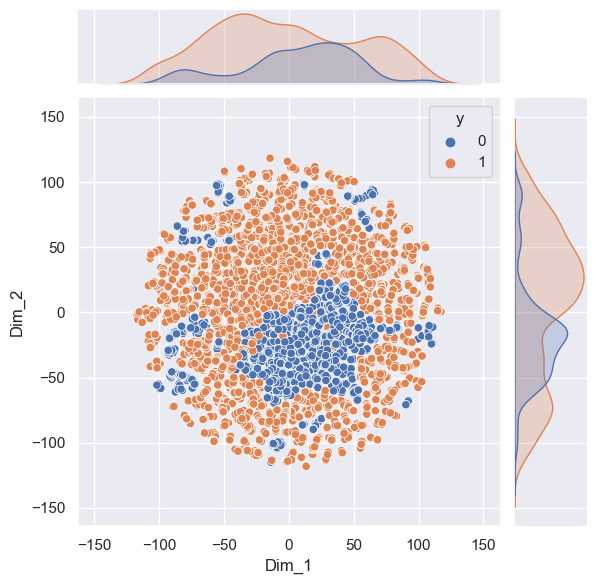

In [16]:
from sklearn.manifold import TSNE
import seaborn as sns
import warnings

if visualization_level > 2:
    warnings.filterwarnings('ignore')
    model = TSNE(n_components=2, perplexity=4, random_state=0)
    tsne_data = model.fit_transform(X_array.reshape(X_array.shape[0], number_of_bands * temporal_samples))
    tsne_df = pd.DataFrame(data=tsne_data, columns=("Dim_1", "Dim_2"))
    tsne_data = pd.concat([tsne_df, pd.DataFrame(labels, columns=['y'])], axis=1)
    tsne_df = pd.DataFrame(data=tsne_data, columns=("Dim_1", "Dim_2", "y"))

    sns.jointplot(data=tsne_df, x="Dim_1", y="Dim_2", hue='y')
    plt.show()
    warnings.filterwarnings('default')

## Sample visualization

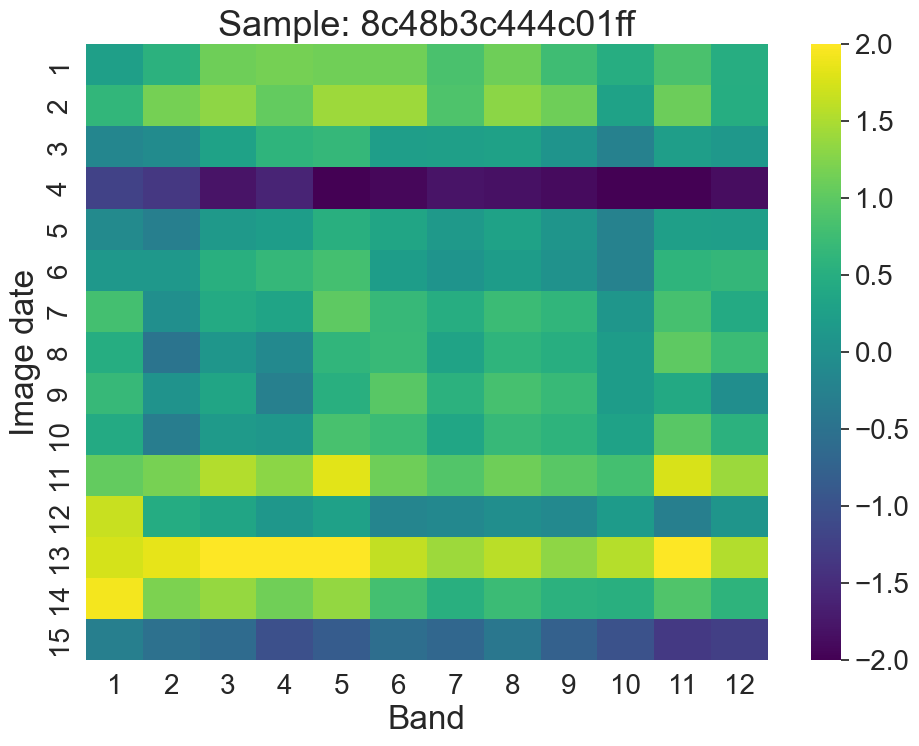

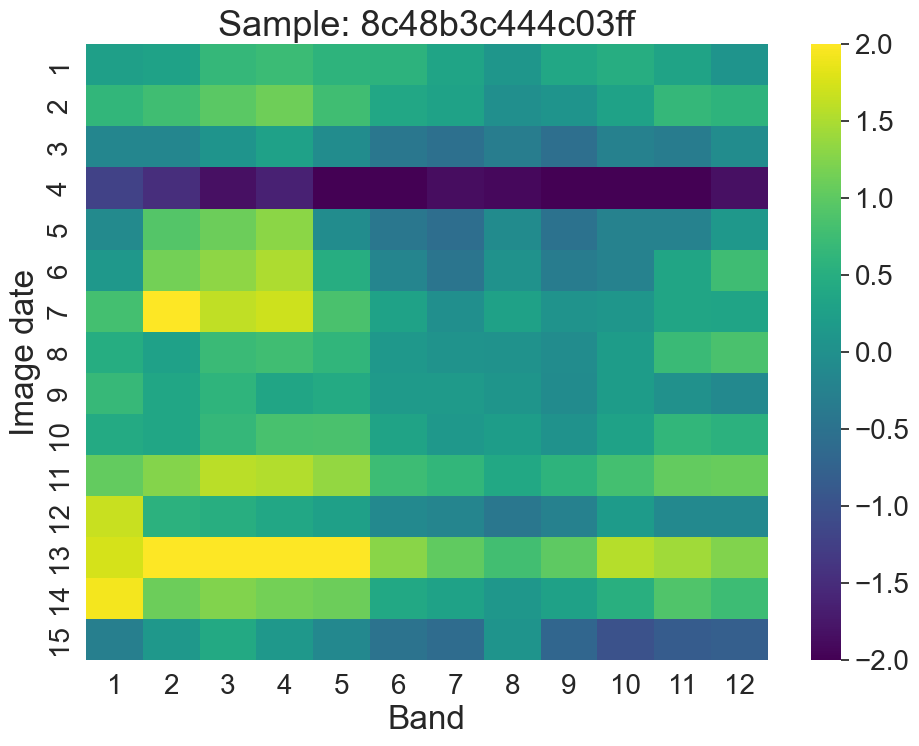

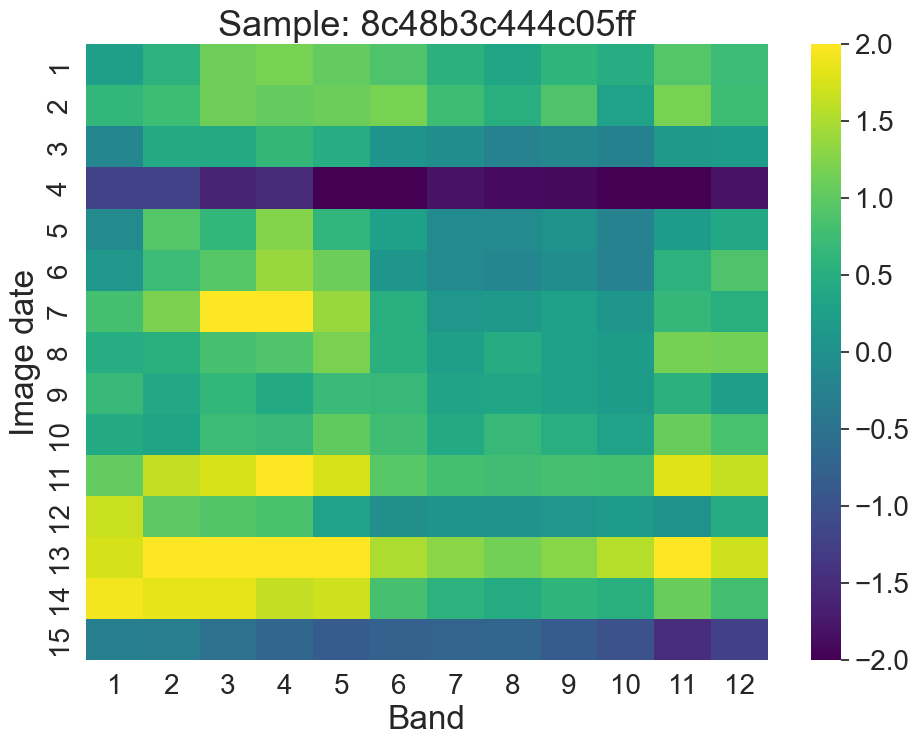

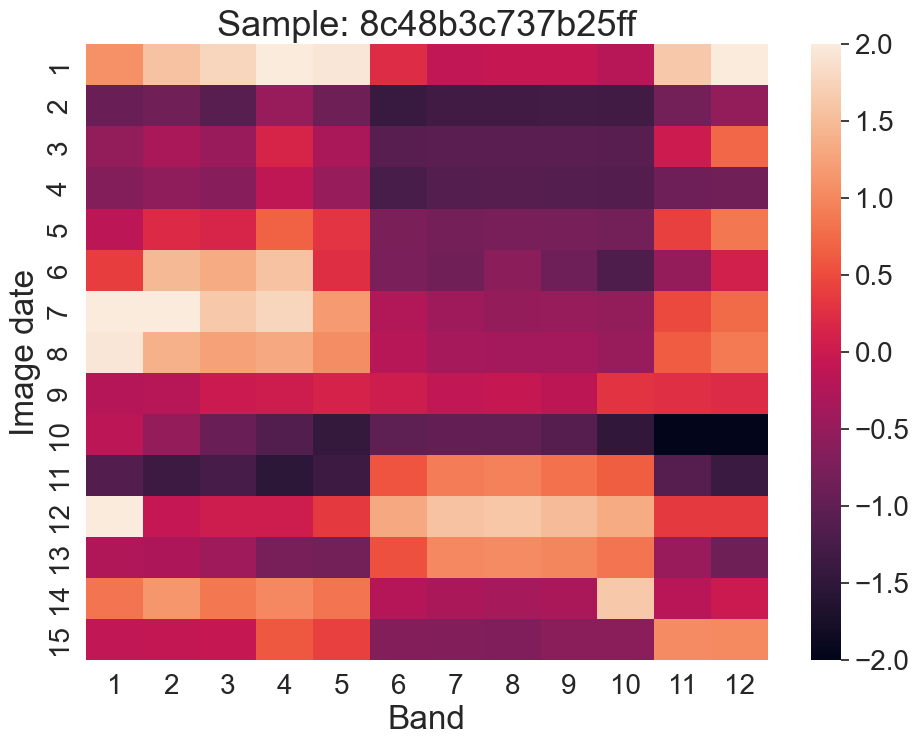

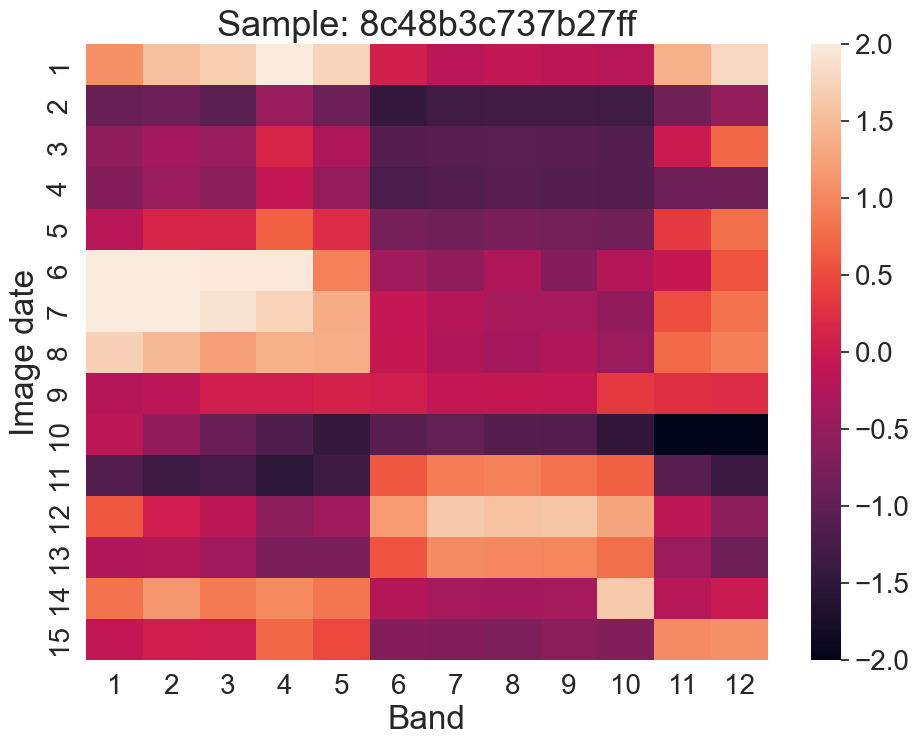

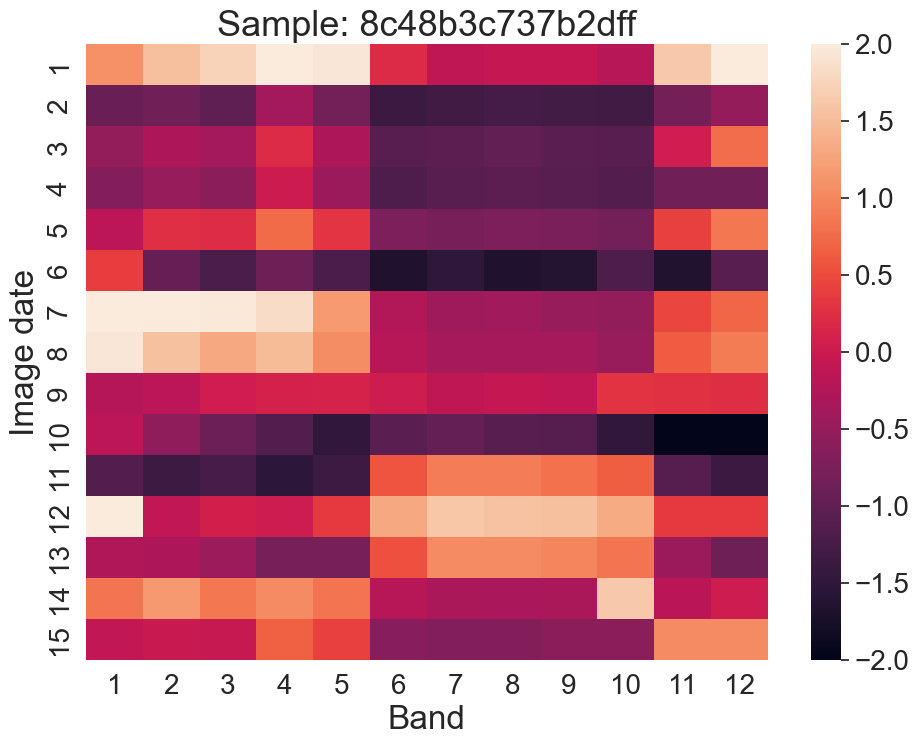

In [17]:
if visualization_level > 2:
    sns.set(rc={'figure.figsize':(11,8)})

    for i in range(0,3):
        # This is what a positive sample looks like
        ax = sns.heatmap(X_array[i], annot=False, cmap="viridis", vmin=-2, vmax=2, 
                         xticklabels=range(1,13), yticklabels=range(1,16), 
                         fmt='g', annot_kws={"fontsize":24}, cbar=True)
        ax.set_xlabel("Band",fontsize=24)
        ax.set_ylabel("Image date",fontsize=24)
        ax.set_title('Sample: ' + hexes[i], fontsize=26)
        ax.tick_params(labelsize=20)

        cbar = ax.collections[0].colorbar
        cbar.ax.tick_params(labelsize=20)
        plt.show()



    for i in range(-4,-1):  
        ax = sns.heatmap(X_array[i], annot=False, cmap="rocket", vmin=-2, vmax=2, 
                         xticklabels=range(1,13), yticklabels=range(1,16), 
                         fmt='g', annot_kws={"fontsize":20}, cbar=True)
        ax.set_xlabel("Band",fontsize=24)
        ax.set_ylabel("Image date",fontsize=24)
        ax.set_title('Sample: ' + hexes[i], fontsize=26)
        ax.tick_params(labelsize=20)

        cbar = ax.collections[0].colorbar
        cbar.ax.tick_params(labelsize=20)
        plt.show()

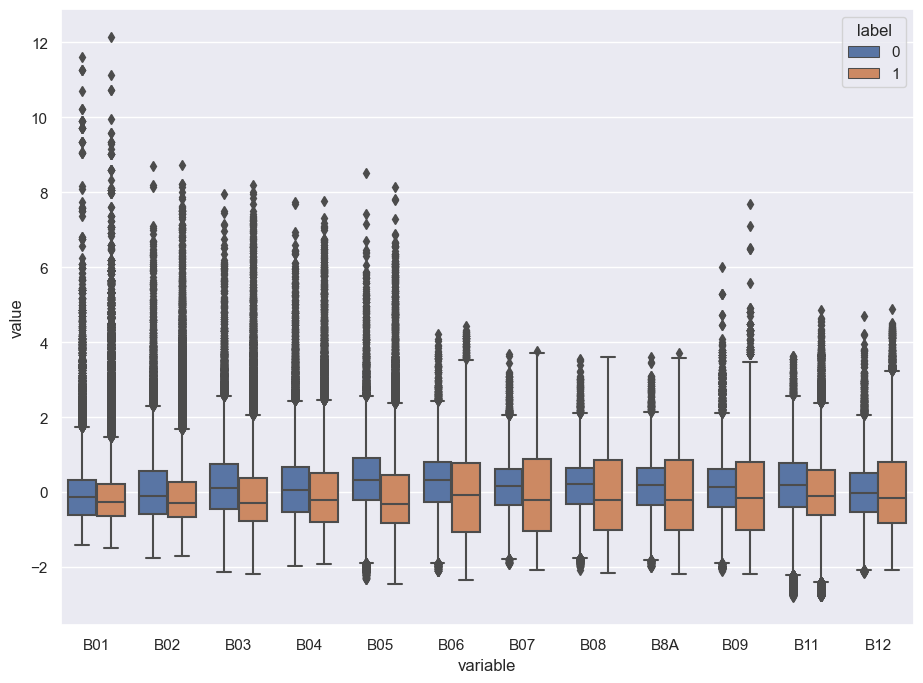

In [18]:
import pandas as pd
import seaborn as sns

if visualization_level > 2:
    value_vars = [i for i in df.columns if i.startswith('B')]
    id_vars = ['label']
    data = pd.melt(df, id_vars=id_vars, value_vars=value_vars)

    sns.set(rc={'figure.figsize':(11,8)})
    sns.boxplot(x="variable", y="value", hue='label', data=data)

# Check correlation among bands

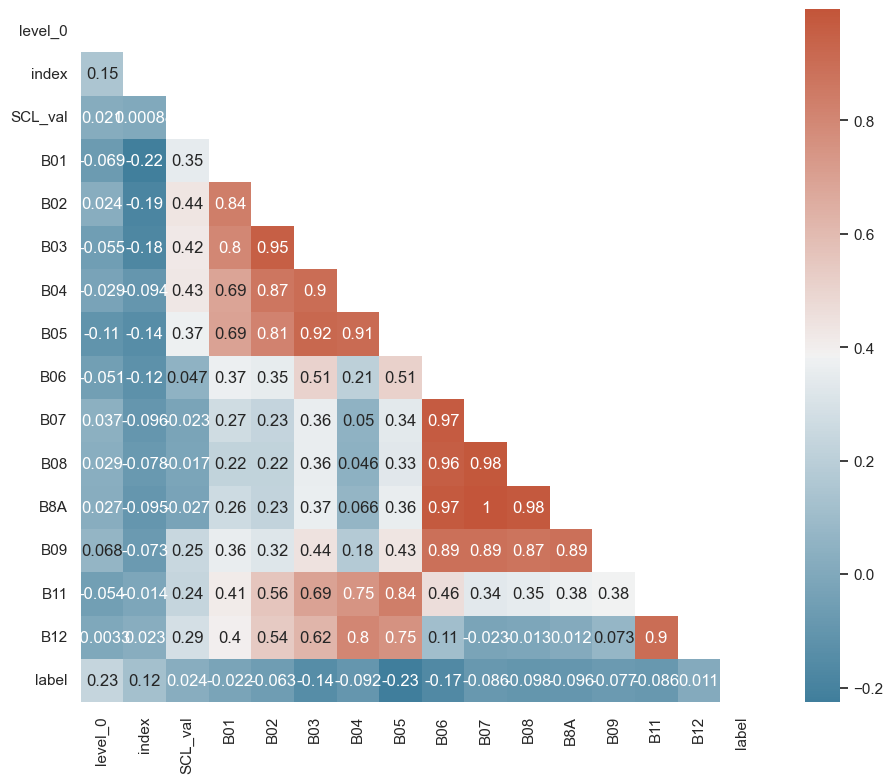

In [19]:
if visualization_level > 2:
    sns.set_theme(style="white")
    # Compute the correlation matrix
    corr = df.corr()

    # Generate a mask for the upper triangle
    mask = np.triu(np.ones_like(corr, dtype=bool))

    # Set up the matplotlib figure
    f, ax = plt.subplots(figsize=(11, 9))

    # Generate a custom diverging colormap
    cmap = sns.diverging_palette(230, 20, as_cmap=True)
    sns.heatmap(corr,mask=mask,cmap=cmap, annot=True )

## Prepare the Dataset for Training

In [1]:
test_index = np.array(fop) == test_field
val_index = np.array(fop) == val_field
print('The test field has number of hexes equals to ', sum(test_index))

NameError: name 'np' is not defined

In [21]:
print('Total of samples:', X_array.shape)

labels_and_hexes = np.vstack((hexes, labels)).T

# Test dataset is the field we picked to test
X_test = X_array[test_index]
labels_test = np.array(labels)[test_index]
hexes_test = np.array(hexes)[test_index]
y_test = np.array(labels)[test_index]

X_val = X_array[val_index]
labels_val = np.array(labels)[val_index]
hexes_val = np.array(hexes)[val_index]
y_val = np.array(labels)[val_index]

# Train dataset is every but the test field
X_train = X_array[~(test_index+val_index )]
labels_train = np.array(labels)[~(test_index+val_index)]
hexes_train = np.array(hexes)[~(test_index+val_index)]

# Negative train
X_array_n = X_train[np.array(labels_train) == 0]
# Positive train
X_array_p = X_train[np.array(labels_train) == 1]

# Anchors are half of the positive train
X_array_anchors = X_array_p[0:math.floor((X_array_p.shape[0]/2))]
# Positives are the other half of the positive train
X_array_positives = X_array_p[math.floor(X_array_p.shape[0]/2):-1]
# Negatives are half of the negative train samples
X_array_negatives = X_array_n[0:math.floor((X_array_p.shape[0]/2))]

print('Total of anchors samples:', X_array_anchors.shape)
print('Total of positive samples:', X_array_positives.shape)
print('Total of negative samples:', X_array_negatives.shape)

samples_count = X_array_anchors.shape[0]
print('Number of samples:', samples_count)

Total of samples: (7115, 15, 12)
Total of anchors samples: (2414, 15, 12)
Total of positive samples: (2414, 15, 12)
Total of negative samples: (1874, 15, 12)
Number of samples: 2414


In [22]:
def prepare_dataset():
    anchor_dataset = tf.data.Dataset\
        .from_tensor_slices(X_array_anchors)

    positive_dataset = tf.data.Dataset\
        .from_tensor_slices(X_array_positives)
    
    negative_dataset = tf.data.Dataset\
        .from_tensor_slices(X_array_negatives)
    
    return anchor_dataset, positive_dataset, negative_dataset
   
anchor_dataset, positive_dataset, negative_dataset = prepare_dataset()
print(anchor_dataset, positive_dataset, negative_dataset)

dataset = tf.data.Dataset.zip((anchor_dataset, positive_dataset, negative_dataset))
dataset = dataset.shuffle(buffer_size=128)

# Let's now split our dataset in train and validation.
train_dataset = dataset.take(round(samples_count * 0.8))
val_dataset = dataset.skip(round(samples_count * 0.8))

train_dataset = train_dataset.batch(32, drop_remainder=False)
#train_dataset = train_dataset.prefetch(8)

val_dataset = val_dataset.batch(32, drop_remainder=False)
#val_dataset = val_dataset.prefetch(8)


<TensorSliceDataset shapes: (15, 12), types: tf.float64> <TensorSliceDataset shapes: (15, 12), types: tf.float64> <TensorSliceDataset shapes: (15, 12), types: tf.float64>


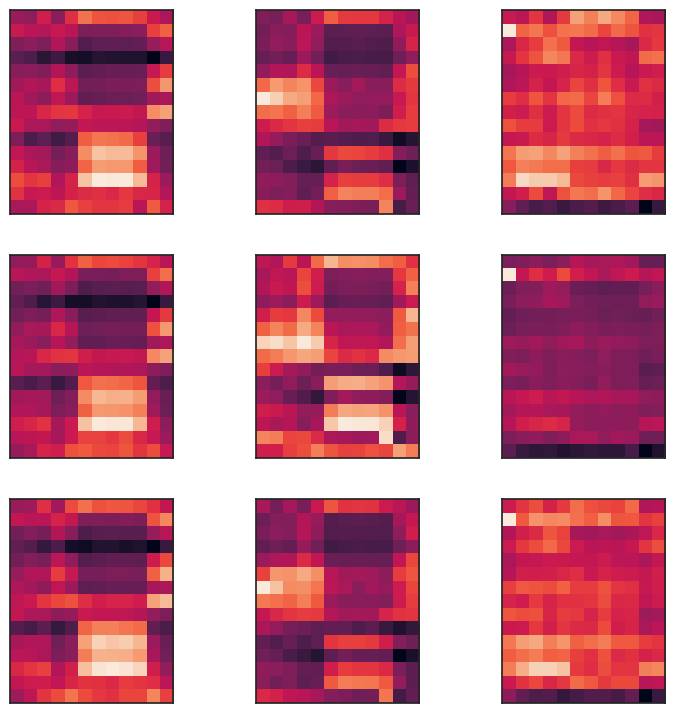

In [23]:
def visualize(anchor, positive, negative):
    """Visualize a few triplets from the supplied batches."""

    def show(ax, image):
        ax.imshow(image)
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

    fig = plt.figure(figsize=(9, 9))

    axs = fig.subplots(3, 3)
    for i in range(3):
        show(axs[i, 0], anchor[i])
        show(axs[i, 1], positive[i])
        show(axs[i, 2], negative[i])


if visualization_level > 2:
    visualize(*list(train_dataset.take(1).as_numpy_iterator())[0])

In [24]:
# Define the encoder architecture
def get_encoder():
    return keras.Sequential(
        [
            keras.Input(shape=(temporal_samples, number_of_bands)),
            layers.Conv1D(width, kernel_size=3, strides=1, activation="relu"),
            layers.Conv1D(width, kernel_size=3, strides=1, activation="relu"),
            layers.Conv1D(width, kernel_size=3, strides=1, activation="relu"),
            layers.Conv1D(width, kernel_size=3, strides=1, activation="relu"),
            layers.Flatten(),
            layers.Dense(width, activation="relu"),
        ],
        name="encoder",
    )

embedding = get_encoder()

In [25]:
from tensorflow.keras import Model

class DistanceLayer(layers.Layer):
    """
    This layer is responsible for computing the distance between the anchor
    embedding and the positive embedding, and the anchor embedding and the
    negative embedding.
    """

    def __init__(self, **kwargs):
        super().__init__(**kwargs)

    def call(self, anchor, positive, negative):
        
        if loss_function_distance == 'euclidean':
            ap_distance = tf.reduce_sum(tf.square(anchor - positive), -1)
            an_distance = tf.reduce_sum(tf.square(anchor - negative), -1)
        elif loss_function_distance == 'cosine':
             # Normalize the embeddings
            anchor = tf.nn.l2_normalize(anchor, axis=-1)
            positive = tf.nn.l2_normalize(positive, axis=-1)
            negative = tf.nn.l2_normalize(negative, axis=-1)

            # Compute cosine similarities
            ap_distance = 1.0 - tf.reduce_sum(anchor * positive, axis=-1, keepdims=True)
            an_distance = 1.0 - tf.reduce_sum(anchor * negative, axis=-1, keepdims=True)
        else:
            raise Exception('You must set a distance metric for the loss function')
        
        return (ap_distance, an_distance)


anchor_input = layers.Input(name="anchor", shape=(temporal_samples,number_of_bands))
positive_input = layers.Input(name="positive", shape=(temporal_samples,number_of_bands))
negative_input = layers.Input(name="negative", shape=(temporal_samples,number_of_bands))

distances = DistanceLayer()(
    embedding(anchor_input),
    embedding(positive_input),
    embedding(negative_input),
)

siamese_network = Model(
    inputs=[anchor_input, positive_input, negative_input], outputs=distances
)

In [26]:
class SiameseModel(Model):
    """The Siamese Network model with a custom training and testing loops.

    Computes the triplet loss using the three embeddings produced by the
    Siamese Network.

    The triplet loss is defined as:
       L(A, P, N) = max(‖f(A) - f(P)‖² - ‖f(A) - f(N)‖² + margin, 0)
    """

    def __init__(self, siamese_network, margin=0.5):
        super().__init__()
        self.siamese_network = siamese_network
        self.margin = margin
        self.loss_tracker = keras.metrics.Mean(name="loss")

    def call(self, inputs):
        return self.siamese_network(inputs)

    def train_step(self, data):
        # GradientTape is a context manager that records every operation that
        # you do inside. We are using it here to compute the loss so we can get
        # the gradients and apply them using the optimizer specified in
        # `compile()`.
        with tf.GradientTape() as tape:
            loss = self._compute_loss(data)

        # Storing the gradients of the loss function with respect to the
        # weights/parameters.
        gradients = tape.gradient(loss, self.siamese_network.trainable_weights)

        # Applying the gradients on the model using the specified optimizer
        self.optimizer.apply_gradients(
            zip(gradients, self.siamese_network.trainable_weights)
        )

        # Let's update and return the training loss metric.
        self.loss_tracker.update_state(loss)
        return {"loss": self.loss_tracker.result()}

    def test_step(self, data):
        loss = self._compute_loss(data)

        # Let's update and return the loss metric.
        self.loss_tracker.update_state(loss)
        return {"loss": self.loss_tracker.result()}

    def _compute_loss(self, data):
        # The output of the network is a tuple containing the distances
        # between the anchor and the positive example, and the anchor and
        # the negative example.
        ap_distance, an_distance = self.siamese_network(data)

        # Computing the Triplet Loss by subtracting both distances and
        # making sure we don't get a negative value.
        loss = ap_distance - an_distance
        loss = tf.maximum(loss + self.margin, 0.0)
        return loss

    @property
    def metrics(self):
        # We need to list our metrics here so the `reset_states()` can be
        # called automatically.
        return [self.loss_tracker]


In [ ]:
siamese_model = SiameseModel(siamese_network)
siamese_model.compile(optimizer=keras.optimizers.Adam(0.0001), run_eagerly = False)
siamese_model.fit(train_dataset, epochs=num_epochs, validation_data=val_dataset)

Epoch 1/200
59/59 [==============================] - 1s 2ms/step - loss: 0.2439
Epoch 2/200
59/59 [==============================] - 0s 3ms/step - loss: 0.1554
Epoch 3/200
59/59 [==============================] - 0s 3ms/step - loss: 0.1221
Epoch 4/200
59/59 [==============================] - 0s 3ms/step - loss: 0.0983
Epoch 5/200
59/59 [==============================] - 0s 4ms/step - loss: 0.0818
Epoch 6/200
59/59 [==============================] - 0s 3ms/step - loss: 0.0707
Epoch 7/200
59/59 [==============================] - 0s 4ms/step - loss: 0.0607
Epoch 8/200
59/59 [==============================] - 0s 4ms/step - loss: 0.0534
Epoch 9/200
59/59 [==============================] - 0s 4ms/step - loss: 0.0479
Epoch 10/200
59/59 [==============================] - 0s 4ms/step - loss: 0.0430
Epoch 11/200
59/59 [==============================] - 0s 3ms/step - loss: 0.0388
Epoch 12/200
59/59 [==============================] - 0s 4ms/step - loss: 0.0356
Epoch 13/200
59/59 [=================

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "c:\users\en89912\pycharmprojects\fieldboundarydetection\venv\lib\site-packages\IPython\core\interactiveshell.py", line 3553, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "C:\Users\en89912\AppData\Local\Temp\ipykernel_16412\2579740518.py", line 3, in <module>
    siamese_model.fit(train_dataset, epochs=num_epochs, validation_data=val_dataset)
  File "c:\users\en89912\pycharmprojects\fieldboundarydetection\venv\lib\site-packages\keras\engine\training.py", line 1184, in fit
    tmp_logs = self.train_function(iterator)
  File "c:\users\en89912\pycharmprojects\fieldboundarydetection\venv\lib\site-packages\tensorflow\python\eager\def_function.py", line 885, in __call__
    result = self._call(*args, **kwds)
  File "c:\users\en89912\pycharmprojects\fieldboundarydetection\venv\lib\site-packages\tensorflow\python\eager\def_function.py", line 917, in _call
    return self._stateless_fn(*args, **kwds)  # pylint: disable=not-ca

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "c:\users\en89912\pycharmprojects\fieldboundarydetection\venv\lib\site-packages\IPython\core\interactiveshell.py", line 3553, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "C:\Users\en89912\AppData\Local\Temp\ipykernel_16412\2579740518.py", line 3, in <module>
    siamese_model.fit(train_dataset, epochs=num_epochs, validation_data=val_dataset)
  File "c:\users\en89912\pycharmprojects\fieldboundarydetection\venv\lib\site-packages\keras\engine\training.py", line 1184, in fit
    tmp_logs = self.train_function(iterator)
  File "c:\users\en89912\pycharmprojects\fieldboundarydetection\venv\lib\site-packages\tensorflow\python\eager\def_function.py", line 885, in __call__
    result = self._call(*args, **kwds)
  File "c:\users\en89912\pycharmprojects\fieldboundarydetection\venv\lib\site-packages\tensorflow\python\eager\def_function.py", line 917, in _call
    return self._stateless_fn(*args, **kwds)  # pylint: disable=not-ca

ERROR:root:Internal Python error in the inspect module.
Below is the traceback from this internal error.



Traceback (most recent call last):
  File "c:\users\en89912\pycharmprojects\fieldboundarydetection\venv\lib\site-packages\IPython\core\interactiveshell.py", line 3553, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "C:\Users\en89912\AppData\Local\Temp\ipykernel_16412\2579740518.py", line 3, in <module>
    siamese_model.fit(train_dataset, epochs=num_epochs, validation_data=val_dataset)
  File "c:\users\en89912\pycharmprojects\fieldboundarydetection\venv\lib\site-packages\keras\engine\training.py", line 1184, in fit
    tmp_logs = self.train_function(iterator)
  File "c:\users\en89912\pycharmprojects\fieldboundarydetection\venv\lib\site-packages\tensorflow\python\eager\def_function.py", line 885, in __call__
    result = self._call(*args, **kwds)
  File "c:\users\en89912\pycharmprojects\fieldboundarydetection\venv\lib\site-packages\tensorflow\python\eager\def_function.py", line 917, in _call
    return self._stateless_fn(*args, **kwds)  # pylint: disable=not-ca

# Finetuning model

In [27]:
print('Total of samples:', X_array.shape)

labels_and_hexes = np.vstack((hexes, labels)).T

test_index_ft = np.array(fop) == test_field
val_index_ft = np.array(fop) == val_field

X_test_ft = X_array[test_index_ft]
yl_test_ft = labels_and_hexes[test_index_ft]

X_val_ft = X_array[val_index_ft]
yl_val_ft = labels_and_hexes[val_index_ft]

X_train_ft = X_array[~(test_index_ft+val_index_ft)]
yl_train_ft = labels_and_hexes[~(test_index_ft+val_index_ft)]


labeled_train_samples_ft = X_train_ft.shape[0]
hexes_train_ft, y_train_ft = np.hsplit(yl_train_ft, 2)
hexes_test_ft, y_test_ft = np.hsplit(yl_test_ft, 2)
hexes_val_ft, y_val_ft = np.hsplit(yl_val_ft, 2)
fop_val_ft = fop[val_index_ft]
fop_test_ft = fop[test_index_ft]

y_val_ft = np.array(y_val_ft).T[0]
y_test_ft = np.array(y_test_ft).T[0]
y_train_ft = np.array(y_train_ft).T[0]
hexes_val_ft = np.array(hexes_val_ft).T[0]
hexes_test_ft = np.array(hexes_test_ft).T[0]
hexes_train_ft = np.array(hexes_train_ft).T[0]


y_train_ft = y_train_ft.astype(np.int)
y_test_ft = y_test_ft.astype(np.int)
y_val_ft = y_val_ft.astype(np.int)

print('Total of training samples:',X_train_ft.shape, len(y_train_ft))
print('Total of test samples:', X_test_ft.shape, len(y_test_ft))
print('Total of validation samples:', X_val_ft.shape, len(y_val_ft))


#------------------------------------------------------------------------------------------

def prepare_dataset():

    labeled_batch_size_ft = labeled_train_samples_ft
    batch_size_ft = labeled_batch_size_ft

    train_dataset_ft = tf.data.Dataset\
        .from_tensor_slices((X_train_ft, y_train_ft))\
        .shuffle(buffer_size=10 * labeled_batch_size_ft)\
        .batch(labeled_batch_size_ft, drop_remainder=True)

    test_dataset_ft = tf.data.Dataset\
        .from_tensor_slices((X_test_ft, y_test_ft))\
        .batch(batch_size_ft)\
        .prefetch(buffer_size=tf.data.AUTOTUNE)

    validation_dataset_ft = tf.data.Dataset\
        .from_tensor_slices((X_val_ft, y_val_ft))\
        .batch(batch_size_ft)\
        .prefetch(buffer_size=tf.data.AUTOTUNE)


    return batch_size_ft, train_dataset_ft, test_dataset_ft, validation_dataset_ft

batch_size_ft, train_dataset_ft, test_dataset_ft, validation_dataset_ft = prepare_dataset()

#------------------------------------------------------------------------------------------

# Supervised finetuning of the pretrained encoder
finetuning_model = keras.Sequential(
    [
        layers.Input(shape=(temporal_samples, number_of_bands)),
        embedding,
        layers.Dense(1, activation='sigmoid'),
    ],
    name="finetuning_model",
)
finetuning_model.compile(
    optimizer=keras.optimizers.Adam(),
    loss=keras.losses.BinaryCrossentropy(from_logits=False),
    metrics=[keras.metrics.BinaryAccuracy(name="acc")],
)

print(train_dataset_ft)
print(validation_dataset_ft)
finetuning_history = finetuning_model.fit(
    train_dataset_ft, epochs=num_epochs, validation_data=validation_dataset_ft
)
print(
    "Maximal validation accuracy: {:.2f}%".format(
        max(finetuning_history.history["val_acc"]) * 100
    )
)

#------------------------------------------------------------------------------------------

from sklearn.metrics import accuracy_score, recall_score, precision_score,f1_score,confusion_matrix,matthews_corrcoef

print(
    "Finetuning maximal validation accuracy: {:.2f}%".format(
        max(finetuning_history.history["val_acc"]) * 100
    )
)

print('---------------')

output = finetuning_model.predict(test_dataset_ft)
result = np.where(output > 0.5, 1, 0)

test_ft_df = pd.concat([
                        pd.DataFrame(hexes_test_ft, columns=["hex"]), 
                        pd.DataFrame(fop_test_ft, columns=["FIELD_OPERATION_GUID"])
                      ], axis=1)


display_hexes_map(test_ft_df[y_test_ft==1], test_ft_df[y_test_ft==0], 50000, filename='val_actual_' + tid + '.png')

print('Triplet Loss Accuracy: {:.2f}%'.format(accuracy_score(y_test_ft, result) * 100))
print('Triplet Loss Recall: {:.2f}%'.format(recall_score(y_test_ft, result) * 100))
print('Triplet Loss Precision: {:.2f}%'.format(precision_score(y_test_ft, result) * 100))
print('Triplet Loss F1: {:.2f}%'.format(f1_score(y_test_ft, result) * 100))
m = confusion_matrix(y_test_ft, result)
print('Triplet Loss Acc by Class', (m.diagonal()/m.sum(axis=1)))
print('Triplet Loss MCC:', matthews_corrcoef(y_test_ft, result))

print(
      '%.2f' % (float(accuracy_score(y_test_ft, result))*100) + '\\%&',
      '%.2f' % float(f1_score(y_test_ft, result, average='weighted')*100)+ '\\%&',
      '%.2f' % float(f1_score(y_test_ft, result, average=None)[0]*100)+ '\\%&',
      '%.2f' % float(f1_score(y_test_ft, result, average=None)[1]*100)+ '\\%&',
      '%.2f' % matthews_corrcoef(y_test_ft, result) + '\\\\',
     )

print(confusion_matrix(y_test_ft, result))
confusion_matrix(y_test_ft, result)
accuracy_list = (y_test_ft==result.T[0])


#------------------------------------------------------------------------------------------

df_classes_ft = pd.DataFrame(result, columns=['label'])
df_hexes_ft = pd.DataFrame(hexes_test_ft, columns=['hex'])
df_fop_ft = pd.DataFrame(fop_test_ft, columns=['FIELD_OPERATION_GUID'])

df_predict_ft = pd.concat([df_hexes_ft,df_classes_ft,df_fop_ft], axis=1)

display_hexes_map(df_predict_ft[df_predict_ft.label == 1], df_predict_ft[df_predict_ft.label == 0], 50000, filename='val_predicted_' + tid + '.png')
    

Total of samples: (7115, 15, 12)
ERROR! Session/line number was not unique in database. History logging moved to new session 814
Total of training samples: (6703, 15, 12) 6703
Total of test samples: (175, 15, 12) 175
Total of validation samples: (237, 15, 12) 237
<BatchDataset shapes: ((6703, 15, 12), (6703,)), types: (tf.float64, tf.int32)>
<PrefetchDataset shapes: ((None, 15, 12), (None,)), types: (tf.float64, tf.int32)>
Epoch 1/200



KeyboardInterrupt



## Append results to Report

In [ ]:
# Test report

javascript = '<script> \
function sortTable(n) { \
  var table, rows, switching, i, x, y, shouldSwitch, dir, switchcount = 0; \
  table = document.getElementById("myTable"); \
  switching = true; \
  dir = "asc"; \
  while (switching) { \
    switching = false; \
    rows = table.rows; \
    for (i = 2; i < (rows.length - 1); i++) { \
      shouldSwitch = false; \
      x = rows[i].getElementsByTagName("TD")[n]; \
      y = rows[i + 1].getElementsByTagName("TD")[n]; \
      if (dir == "asc") { \
        if (x.innerHTML.toLowerCase() > y.innerHTML.toLowerCase()) { \
          shouldSwitch = true; \
          break; \
        } \
} else if (dir == "desc") { \
if (x.innerHTML.toLowerCase() < y.innerHTML.toLowerCase()) { \
shouldSwitch = true; \
          break; \
        } \
      } \
    } \
    if (shouldSwitch) { \
      rows[i].parentNode.insertBefore(rows[i + 1], rows[i]); \
      switching = true; \
      switchcount ++; \
    } else { \
      if (switchcount == 0 && dir == "asc") { \
        dir = "desc"; \
        switching = true; \
      } \
    } \
  } \
} \
function myFunction() { \
  var input, filter, table, tr, td, i, txtValue; \
  input = document.getElementById("myInput"); \
  filter = input.value.toUpperCase(); \
  table = document.getElementById("myTable"); \
  tr = table.getElementsByTagName("tr"); \
  var cols = document.getElementById("myTable").rows[1].cells.length;\
  var displayLine = 0; \
  strs = filter.split("|"); \
  for (row = 2; row < tr.length; row++) { \
    for (s = 0; s < strs.length; s++) { \
      for (c = 0; c < cols; c++) { \
        td = tr[row].getElementsByTagName("td")[c]; \
        if (td) { \
          txtValue = td.textContent || td.innerText; \
          console.log(strs[s]); \
          if (txtValue.toUpperCase().indexOf(strs[s]) > -1) { \
            displayLine = displayLine + 1; \
          } else { \
            displayLine = displayLine; \
          } \
        } \
      } \
    } \
    if(displayLine >= (strs.length)) { \
        tr[row].style.display = ""; \
      } \
      else { \
        tr[row].style.display = "none"; \
      } \
      displayLine = 0; \
  } \
}\
function zoom(e){\n\
  var zoomer = e.currentTarget;\n\
  e.offsetX ? offsetX = e.offsetX : offsetX = e.touches[0].pageX\n\
  e.offsetY ? offsetY = e.offsetY : offsetX = e.touches[0].pageX\n\
  x = offsetX/zoomer.offsetWidth*100\n\
  y = offsetY/zoomer.offsetHeight*100\n\
  zoomer.style.backgroundPosition = x + "% " + y + "%";\n\
}\n\
</script>'

style = '<style>\
* {\
  box-sizing: border-box;\
}\
.tooltip {\
  position: relative;\
  display: inline-block;\
  border-bottom: 1px dotted black;\
}\
.tooltip .tooltiptext {\
  visibility: hidden;\
  width: 240px;\
  background-color: black;\
  color: #fff;\
  text-align: center;\
  border-radius: 6px;\
  padding: 5px 0;\
  position: absolute;\
  z-index: 1;\
}\
.tooltip:hover .tooltiptext {\
  visibility: visible;\
}\
#myInput {\
  background-image: url("/css/searchicon.png");\
  background-position: 10px 10px;\
  background-repeat: no-repeat;\
  width: 100%;\
  font-size: 16px;\
  padding: 12px 20px 12px 40px;\
  border: 1px solid #ddd;\
  margin-bottom: 12px;\
}\
#myTable {\
  border-collapse: collapse;\
  width: 100%;\
  border: 1px solid #ddd;\
  font-size: 18px;\
}\
#myTable th, #myTable td {\
  text-align: left;\
  padding: 12px;\
}\
#myTable tr {\
  border-bottom: 1px solid #ddd;\
}\
#myTable tr.header{\
  background-color: #f1f1f1;\
  cursor: pointer;\
}\
#myTable tr:hover {\
  background-color: #f1f1f1;\
}\
figure.zoom {\
  background-position: 50% 50%;\
  position: relative;\
  width: 450px;\
  overflow: hidden;\
  cursor: zoom-in;\
}\
figure.zoom img:hover {\
  opacity: 0;\
}\
figure.zoom img {\
  transition: opacity 0.5s;\
  display: block;\
  width: 100%;\
  height: 100%;\
}\
</style>'

import sys

try:
    with open('report.html', 'r') as file:
        table = file.read()
except:
    table = ''
    table = '<html><head>'
    table += javascript
    table += '<meta name="viewport" content="width=device-width, initial-scale=1">'
    table += style
    table += '</head><body><h2>Search</h2>'
    table += '<input type="text" id="myInput" onkeyup="myFunction()" placeholder="Search for names.." title="Type in a name">'
    table += '<table border=1 id="myTable">\n'
    # Create the table's column headers
    table += '<tr>\n'
    table += '<th colspan=6>Parameters</th>\n'
    table += '<th colspan=1>Test Results</th>'
    table += '<th colspan=5>Validation Results</th>'
    table += '</tr>\n'

    table += '<tr>\n'
    table += '<th href="javascript:void(0)" onclick="sortTable(0)"><div class="tooltip">Description<span class="tooltiptext">Experiment description</span></div></th>'
    table += '<th href="javascript:void(0)" onclick="sortTable(1)"><div class="tooltip">width<span class="tooltiptext">Experiment description</span></div></th>'
    table += '<th href="javascript:void(0)" onclick="sortTable(2)"><div class="tooltip">margin<span class="tooltiptext">Experiment description</span></div></th>'
    table += '<th href="javascript:void(0)" onclick="sortTable(3)"><div class="tooltip">loss function<span class="tooltiptext">Experiment description</span></div></th>'
    table += '<th href="javascript:void(0)" onclick="sortTable(4)"><div class="tooltip">sampling method<span class="tooltiptext">Experiment description</span></div></th>'
    table += '<th href="javascript:void(0)" onclick="sortTable(5)"><div class="tooltip">Bands<span class="tooltiptext">Experiment description</span></div></th>'
    table += '<th href="javascript:void(0)" onclick="sortTable(6)"><div class="tooltip">Test Acc<span class="tooltiptext">Experiment description</span></div></th>'
    
    table += '<th>Accuracy</th>'
    table += '<th>F1</th>'
    table += '<th>MCC</th>'
    table += '<th>Actual</th>'
    table += '<th>Predicted</th>'
    table += '</tr>\n'
    print('No report file found')

    
fileout = open("report.html", "w")

table += '<tr>\n'
table += f'<td>{description}</td><td>{width}</td><td>{siamese_margin}</td><td>{loss_function_distance}</td><td>{sampling_method}</td><td>{band_features}</td>'
table += '<td>{:.2f}%</td>'.format(max(finetuning_history.history["val_acc"]) * 100)
table += '<td>%.2f'  % (float(accuracy_score(y_test_ft, result))*100) + '% </td>'
table += '<td>%.2f'  % float(f1_score(y_test_ft, result, average='weighted')*100) + '% </td>'
table += '<td>%.2f' % matthews_corrcoef(y_test_ft, result)+ '</td>'
table += f'<td><figure class="zoom" onmousemove="zoom(event)" style="background-image: url(val_actual_{tid}.png)"> <img src="val_actual_{tid}.png" /> </figure></td>'
table += f'<td><figure class="zoom" onmousemove="zoom(event)" style="background-image: url(val_predicted_{tid}.png)"> <img src="val_predicted_{tid}.png" /> </figure></td>'
table += '</tr>\n'

fileout.writelines(table)
fileout.close()

# End of Notebook